In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from keras.src.utils.dataset_utils import labels_to_dataset
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import LabelEncoder
# noinspection PyUnresolvedReferences
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.regularizers import l2

read data

In [2]:
train = pd.read_csv('data/train.csv')
test = pd.read_csv('data/test.csv')
train.head(5)

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


*show data information*

In [3]:
train.shape

(20758, 18)

In [4]:
train.columns

Index(['id', 'Gender', 'Age', 'Height', 'Weight',
       'family_history_with_overweight', 'FAVC', 'FCVC', 'NCP', 'CAEC',
       'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE', 'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

drop id column

In [5]:
train.drop(columns='id', axis=1, inplace=True)
test.drop(columns='id', axis=1, inplace=True)

In [6]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,20758.0,23.841804,5.688072,14.00,20.000000,22.815416,26.000000,61.000000
Height,20758.0,1.700245,0.087312,1.45,1.631856,1.700000,1.762887,1.975663
Weight,20758.0,87.887768,26.379443,39.00,66.000000,84.064875,111.600553,165.057269
FCVC,20758.0,2.445908,0.533218,1.00,2.000000,2.393837,3.000000,3.000000
NCP,20758.0,2.761332,0.705375,1.00,3.000000,3.000000,3.000000,4.000000
CH2O,20758.0,2.029418,0.608467,1.00,1.792022,2.000000,2.549617,3.000000
FAF,20758.0,0.981747,0.838302,0.00,0.008013,1.000000,1.587406,3.000000
TUE,20758.0,0.616756,0.602113,0.00,0.000000,0.573887,1.000000,2.000000


In [7]:
train.describe(include='object').T

,count,unique,top,freq
Gender,20758,2,Female,10422
family_history_with_overweight,20758,2,yes,17014
FAVC,20758,2,yes,18982
CAEC,20758,4,Sometimes,17529
SMOKE,20758,2,no,20513
SCC,20758,2,no,20071
CALC,20758,3,Sometimes,15066
MTRANS,20758,5,Public_Transportation,16687
NObeyesdad,20758,7,Obesity_Type_III,4046


In [8]:
print('TRAIN DATA\n')
print(f'{train.isna().sum()}\n\n\n')

print('TEST DATA\n')
print(test.isna().sum())

TRAIN DATA

Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64



TEST DATA

Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                    

{'Height', 'family_history_with_overweight', 'Gender', 'Weight', 'MTRANS', 'SCC', 'Age', 'FCVC'}

In [11]:
# ['Height', 'family_history_with_overweight', 'Gender', 'Weight', 'MTRANS', 'SCC', 'Age', 'FCVC']
train.drop(
    columns=['CAEC', 'SMOKE', 'CALC', 'FAVC', 'NCP', 'CH2O', 'FAF', 'TUE'],
    axis=1, 
    inplace=True
)

test.drop(
    columns=['CAEC', 'SMOKE', 'CALC', 'FAVC', 'NCP', 'CH2O', 'FAF', 'TUE'],
    axis=1, 
    inplace=True
)

In [12]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,20758.0,23.841804,5.688072,14.00,20.000000,22.815416,26.000000,61.000000
Height,20758.0,1.700245,0.087312,1.45,1.631856,1.700000,1.762887,1.975663
Weight,20758.0,87.887768,26.379443,39.00,66.000000,84.064875,111.600553,165.057269
FCVC,20758.0,2.445908,0.533218,1.00,2.000000,2.393837,3.000000,3.000000


In [13]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 9 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          20758 non-null  object 
 1   Age                             20758 non-null  float64
 2   Height                          20758 non-null  float64
 3   Weight                          20758 non-null  float64
 4   family_history_with_overweight  20758 non-null  object 
 5   FCVC                            20758 non-null  float64
 6   SCC                             20758 non-null  object 
 7   MTRANS                          20758 non-null  object 
 8   NObeyesdad                      20758 non-null  object 
dtypes: float64(4), object(5)
memory usage: 1.4+ MB


Saving data after feature selection

In [14]:
train.to_csv("data/featureSelection/train.csv")
test.to_csv("data/featureSelection/test.csv")

plots and info

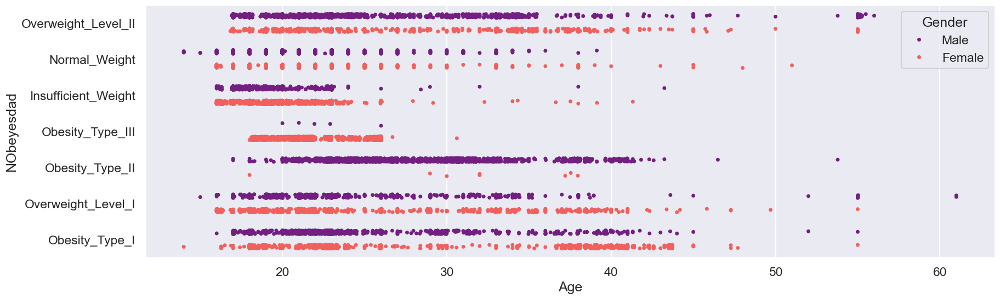

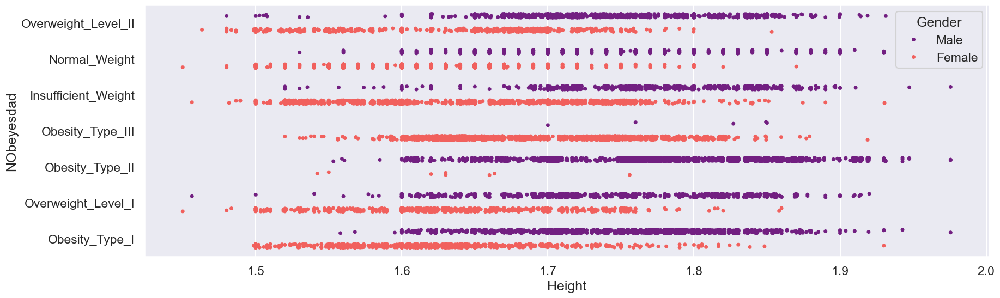

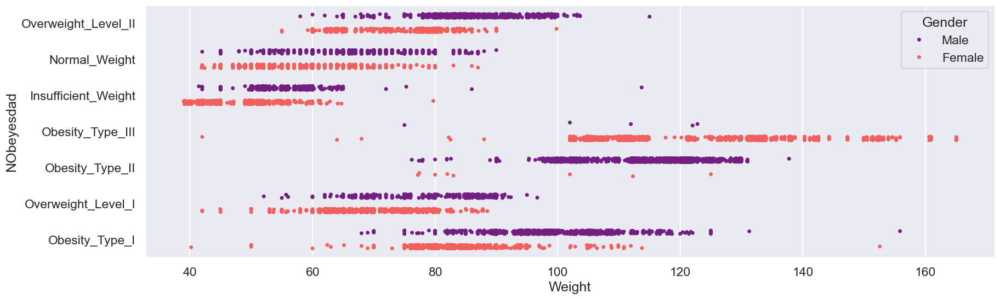

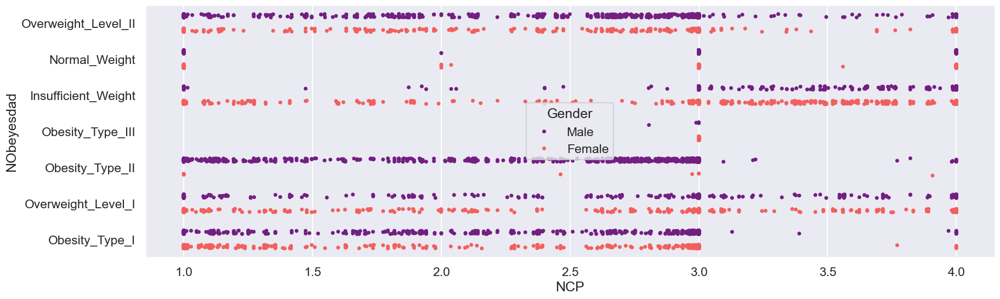

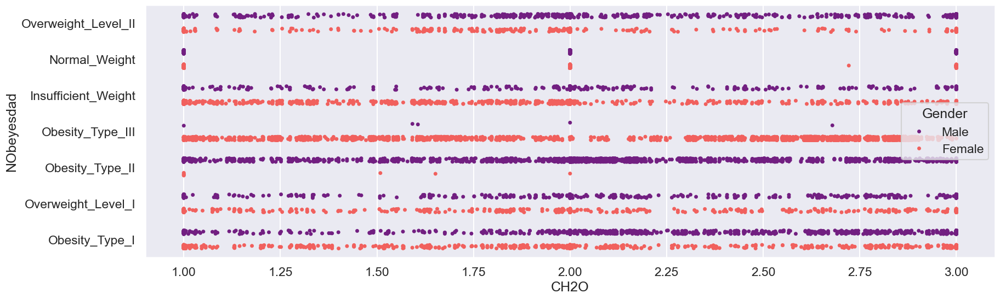

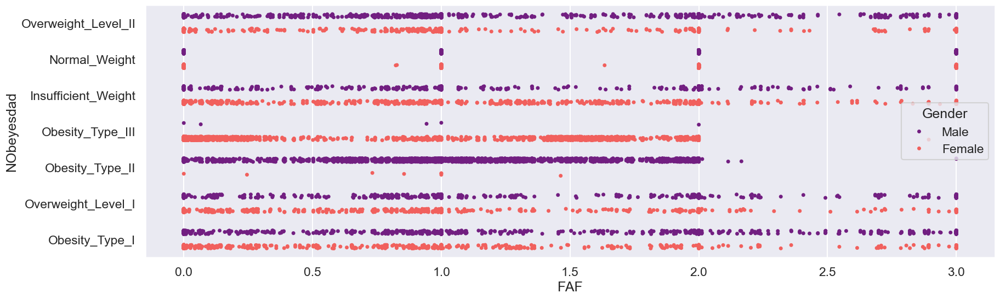

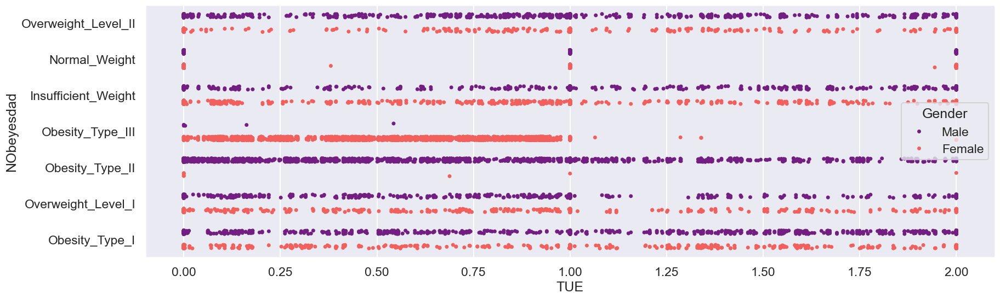

In [50]:
for feature in ['Age', 'Height', 'Weight', 'NCP', 'CH2O', 'FAF', 'TUE']:
    plt.figure(figsize=(20, 6))
    sns.set_context('talk')
    sns.stripplot(y = 'NObeyesdad', x = f'{feature}', data =train, jitter=True, hue='Gender', dodge=True, palette='magma')
    

C:\Users\NewTech\AppData\Local\Temp\ipykernel_6352\334319226.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x = 'Gender', y = 'NObeyesdad', data =train,  palette='magma')


<Axes: xlabel='Gender', ylabel='NObeyesdad'>

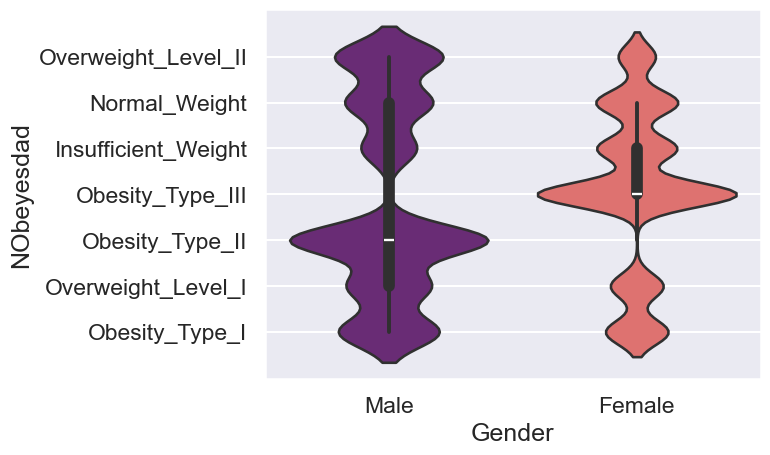

In [51]:
sns.violinplot(x = 'Gender', y = 'NObeyesdad', data =train,  palette='magma')

C:\Users\NewTech\AppData\Local\Temp\ipykernel_6352\2610879614.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x = 'family_history_with_overweight', y = 'NObeyesdad', data =train,  palette='magma')


<Axes: xlabel='family_history_with_overweight', ylabel='NObeyesdad'>

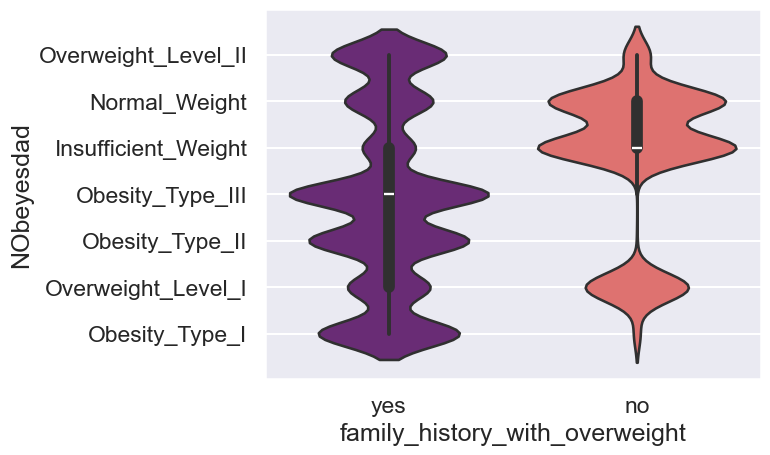

In [52]:
sns.violinplot(x = 'family_history_with_overweight', y = 'NObeyesdad', data =train,  palette='magma')

C:\Users\NewTech\AppData\Local\Temp\ipykernel_6352\2807732754.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x = 'FAVC', y = 'NObeyesdad', data =train,  palette='magma')


<Axes: xlabel='FAVC', ylabel='NObeyesdad'>

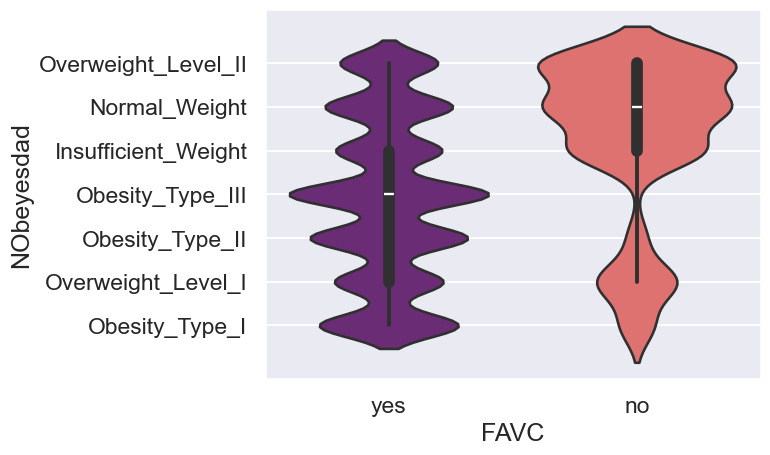

In [53]:
sns.violinplot(x = 'FAVC', y = 'NObeyesdad', data =train,  palette='magma')

C:\Users\NewTech\AppData\Local\Temp\ipykernel_6352\566321645.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x = 'SCC', y = 'NObeyesdad', data =train,  palette='magma')


<Axes: xlabel='SCC', ylabel='NObeyesdad'>

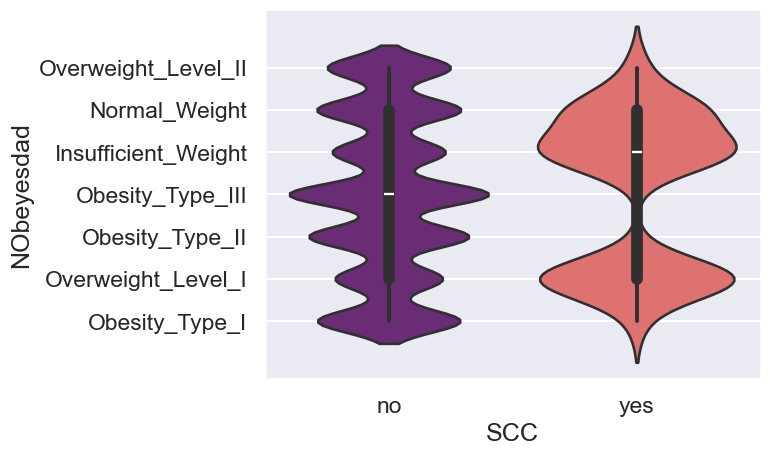

In [54]:
sns.violinplot(x = 'SCC', y = 'NObeyesdad', data =train,  palette='magma')

C:\Users\NewTech\AppData\Local\Temp\ipykernel_6352\1344100144.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x = 'MTRANS', y = 'NObeyesdad', data =train,  palette='magma')


<Axes: xlabel='MTRANS', ylabel='NObeyesdad'>

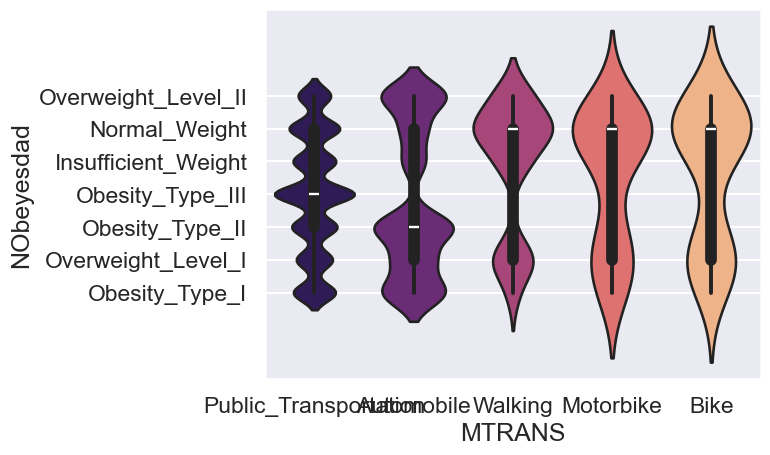

In [55]:
sns.violinplot(x = 'MTRANS', y = 'NObeyesdad', data =train,  palette='magma')

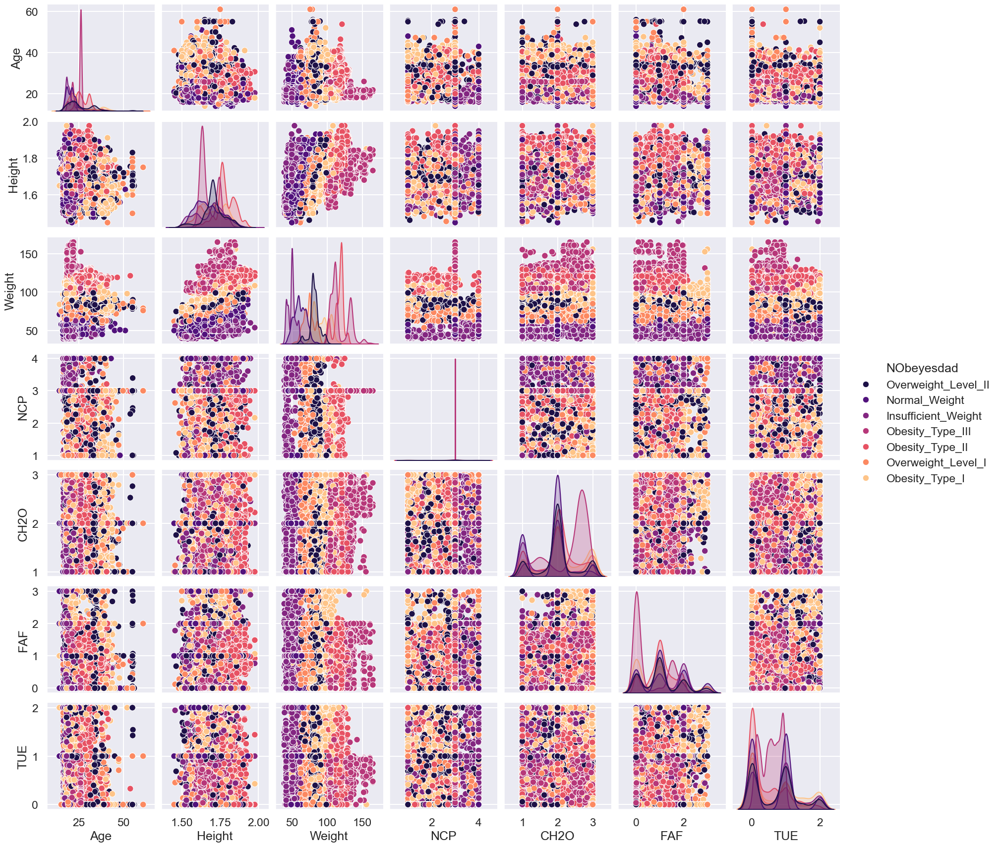

In [56]:
sns.pairplot(train, hue = 'NObeyesdad', palette = 'magma')

In [15]:
train.duplicated().sum()

np.int64(2022)

In [16]:
train = train.drop_duplicates()
X = train.drop(['NObeyesdad'], axis=1)

X.head()


,Gender,Age,Height,Weight,family_history_with_overweight,FCVC,SCC,MTRANS
0,Male,24.443011,1.699998,81.669950,yes,2.000000,no,Public_Transportation
1,Female,18.000000,1.560000,57.000000,yes,2.000000,no,Automobile
2,Female,18.000000,1.711460,50.165754,yes,1.880534,no,Public_Transportation
3,Female,20.952737,1.710730,131.274851,yes,3.000000,no,Public_Transportation
4,Male,31.641081,1.914186,93.798055,yes,2.679664,no,Public_Transportation


In [17]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18736 entries, 0 to 20757
Data columns (total 8 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          18736 non-null  object 
 1   Age                             18736 non-null  float64
 2   Height                          18736 non-null  float64
 3   Weight                          18736 non-null  float64
 4   family_history_with_overweight  18736 non-null  object 
 5   FCVC                            18736 non-null  float64
 6   SCC                             18736 non-null  object 
 7   MTRANS                          18736 non-null  object 
dtypes: float64(4), object(4)
memory usage: 1.3+ MB


In [18]:
columns_to_encode = ['Height', 'family_history_with_overweight', 'Gender', 'Weight', 'MTRANS', 'SCC', 'Age', 'FCVC']
encoder = LabelEncoder()
for features in columns_to_encode:
    X[features]=encoder.fit_transform(X[features])
    
y = encoder.fit_transform(train.NObeyesdad)    
X.head()


,Gender,Age,Height,Weight,family_history_with_overweight,FCVC,SCC,MTRANS
0,1,956,821,617,1,233,0,3
1,0,92,114,233,1,233,0,0
2,0,92,913,126,1,181,0,3
3,0,451,908,1831,1,933,0,3
4,1,1412,1819,926,1,654,0,3


plots

C:\Users\NewTech\AppData\Local\Temp\ipykernel_6352\1599444783.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot( X[feature], color='red')
C:\Users\NewTech\AppData\Local\Temp\ipykernel_6352\1599444783.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot( X[feature], color='red')
C:\Users\NewTech

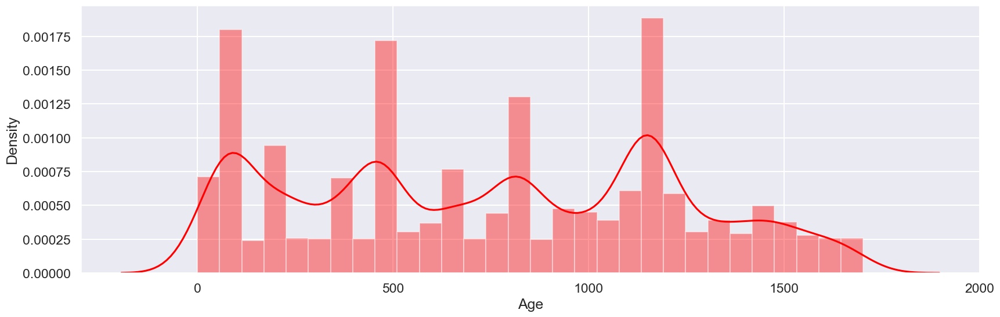

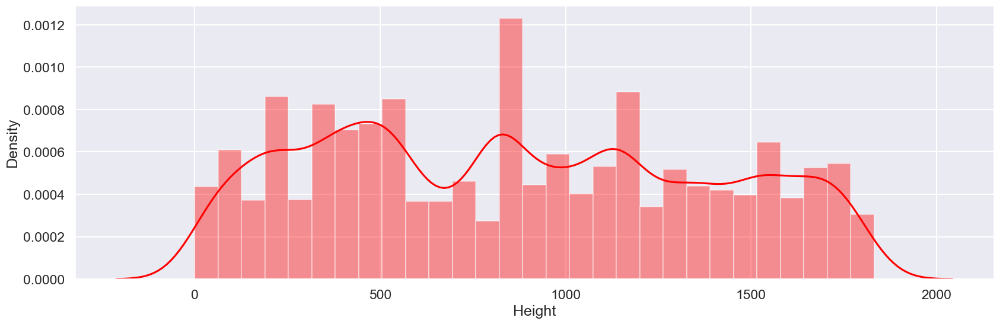

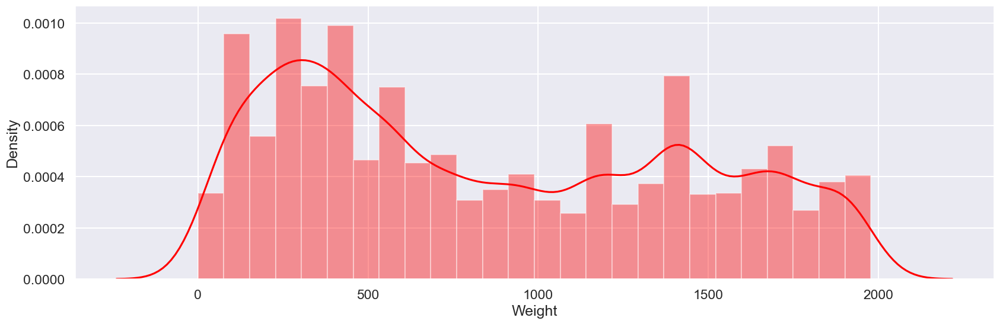

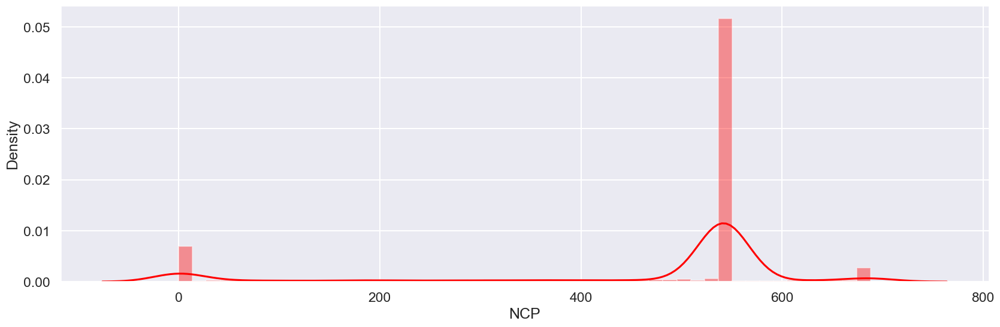

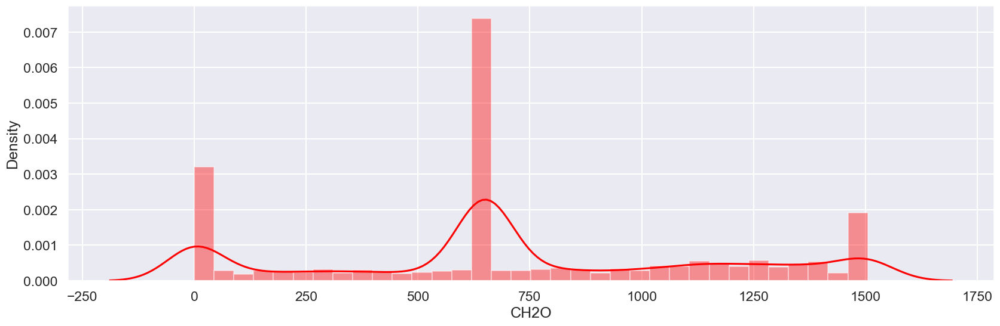

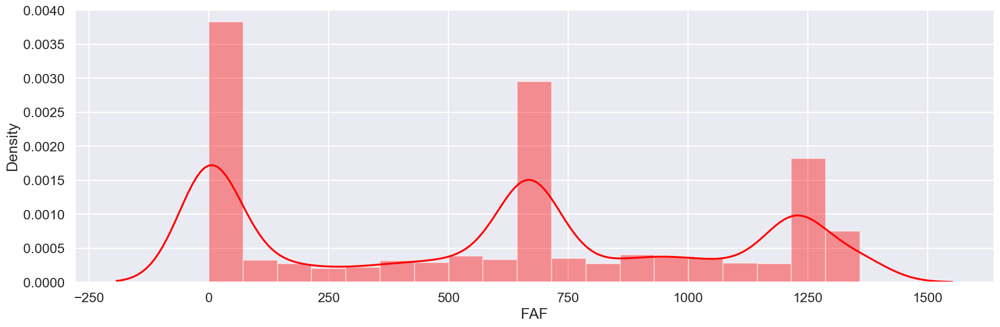

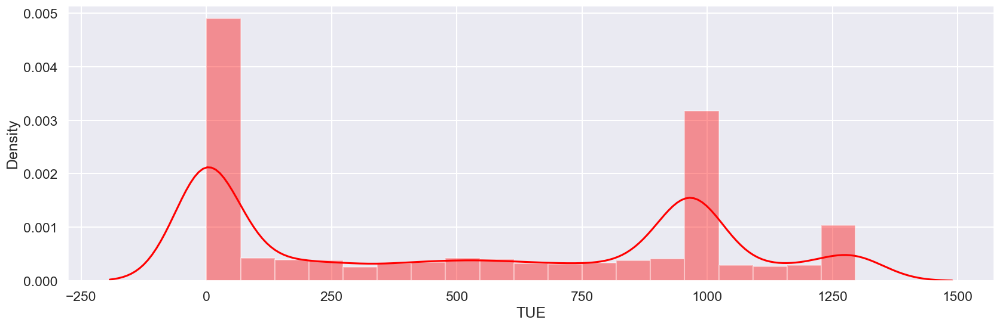

In [61]:
# continuous_features 
for feature in ['Age', 'Height', 'Weight', 'NCP', 'CH2O', 'FAF', 'TUE']:
    plt.figure(figsize=(20, 6))
    sns.distplot( X[feature], color='red')

C:\Users\NewTech\AppData\Local\Temp\ipykernel_6352\234743749.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x = f'{feature}', y = 'NObeyesdad', data =train,  palette='magma')
C:\Users\NewTech\AppData\Local\Temp\ipykernel_6352\234743749.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x = f'{feature}', y = 'NObeyesdad', data =train,  palette='magma')
C:\Users\NewTech\AppData\Local\Temp\ipykernel_6352\234743749.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x = f'{feature}', y = 'NObeyesdad', data =train,  palette='magma'

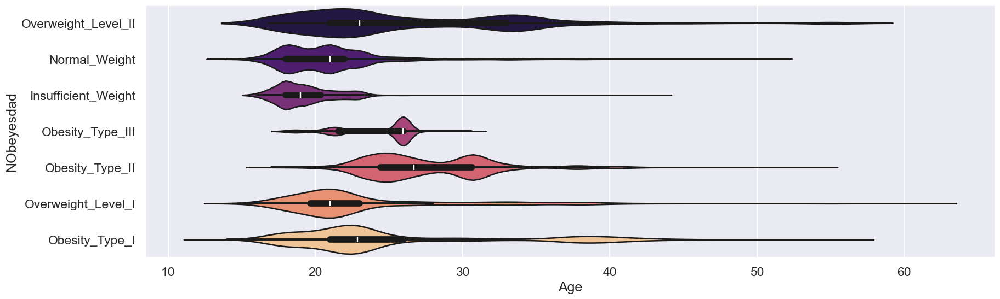

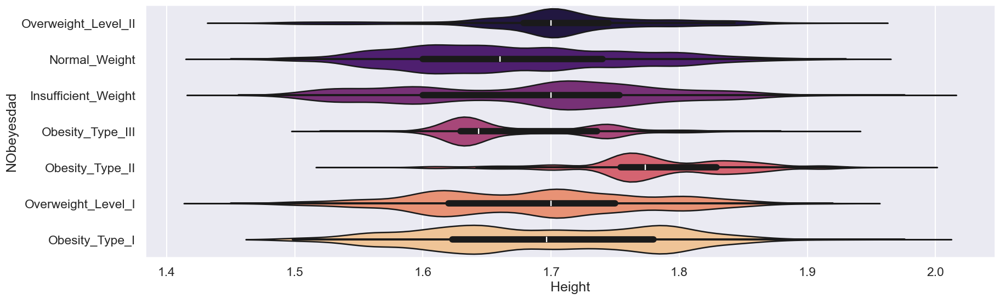

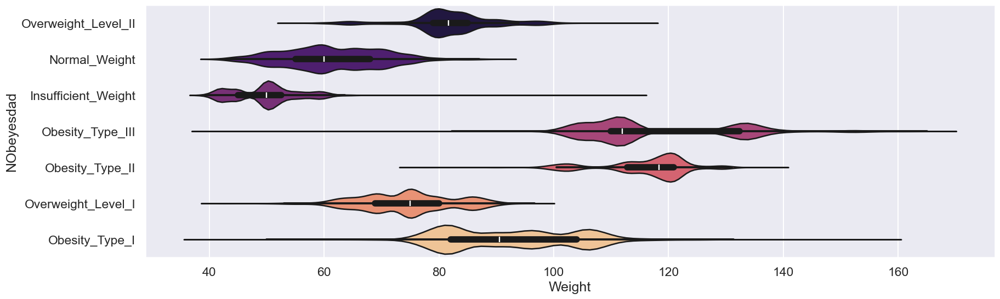

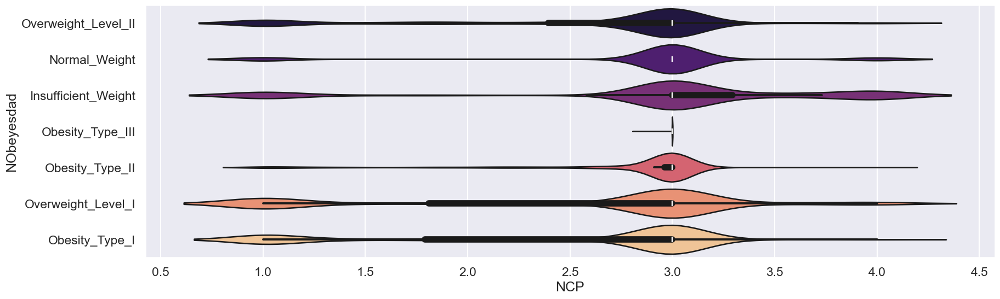

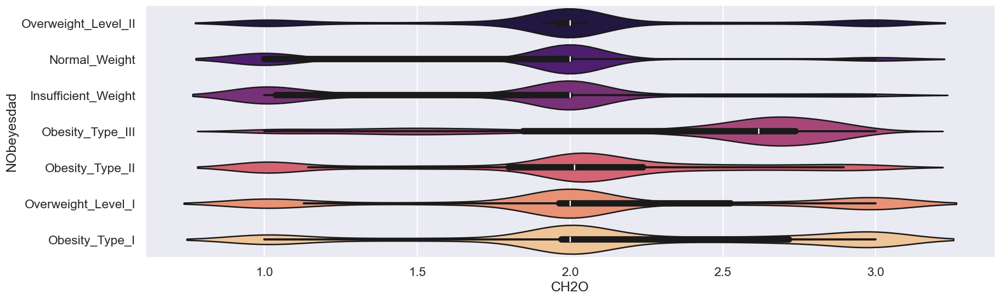

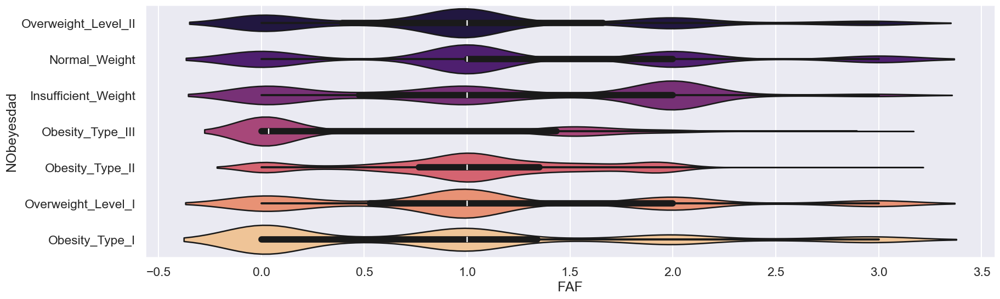

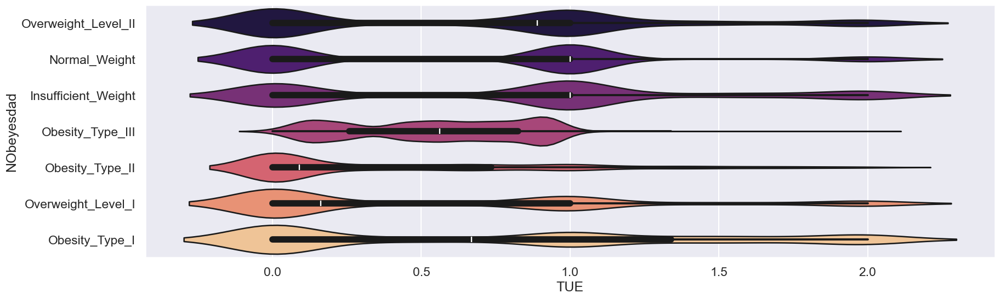

In [62]:
for feature in ['Age', 'Height', 'Weight', 'NCP', 'CH2O', 'FAF', 'TUE']:
    plt.figure(figsize=(20, 6))
    sns.violinplot(x = f'{feature}', y = 'NObeyesdad', data =train,  palette='magma')

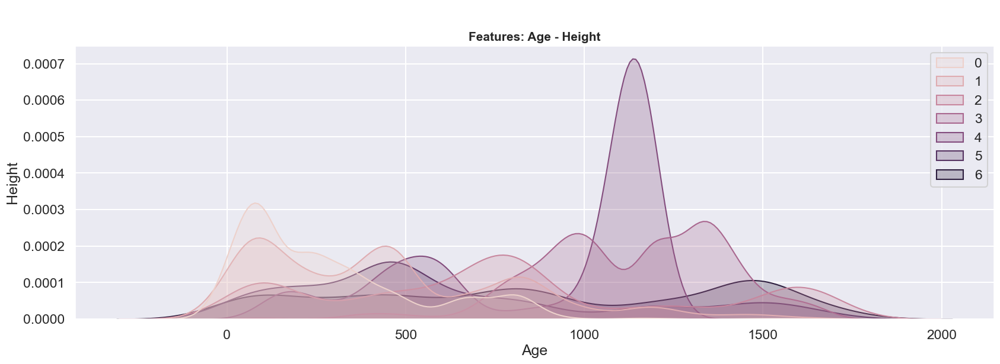

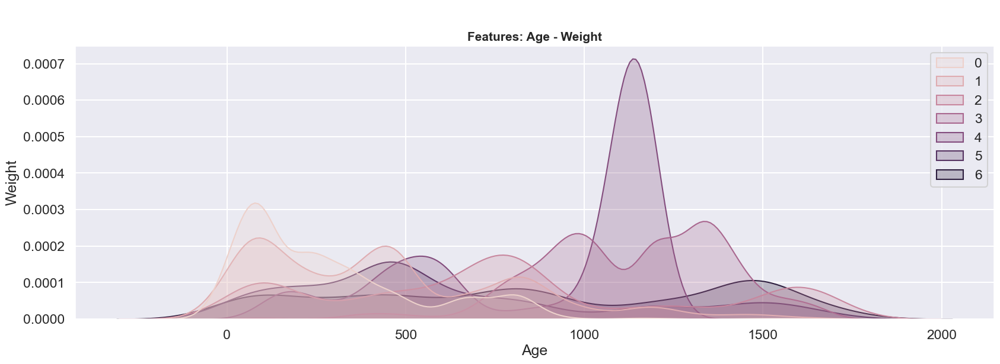

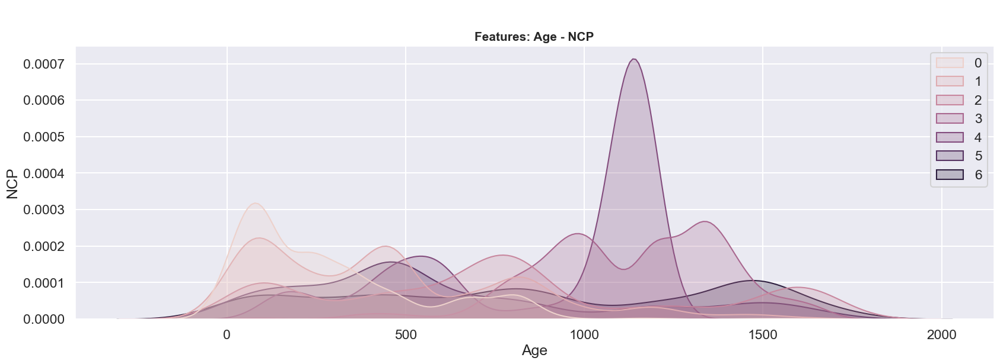

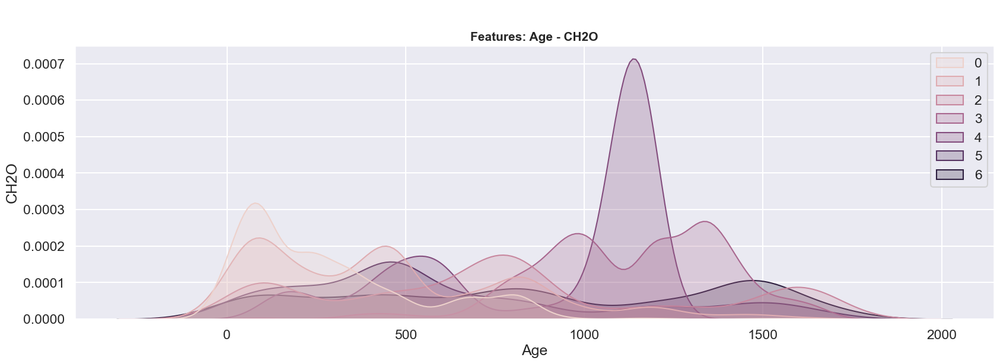

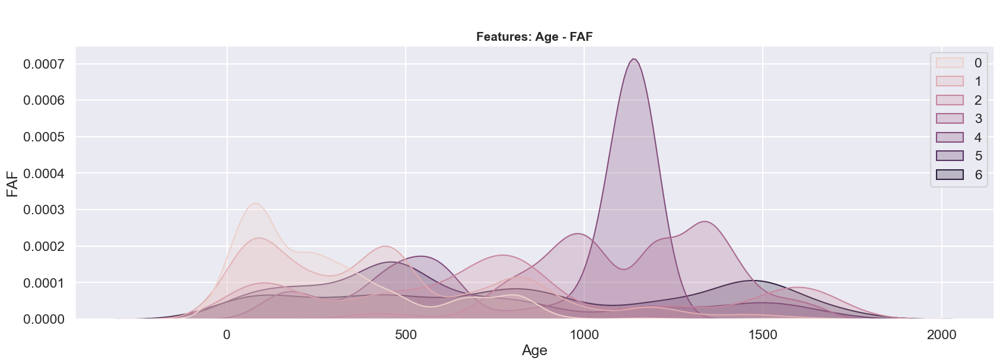

...

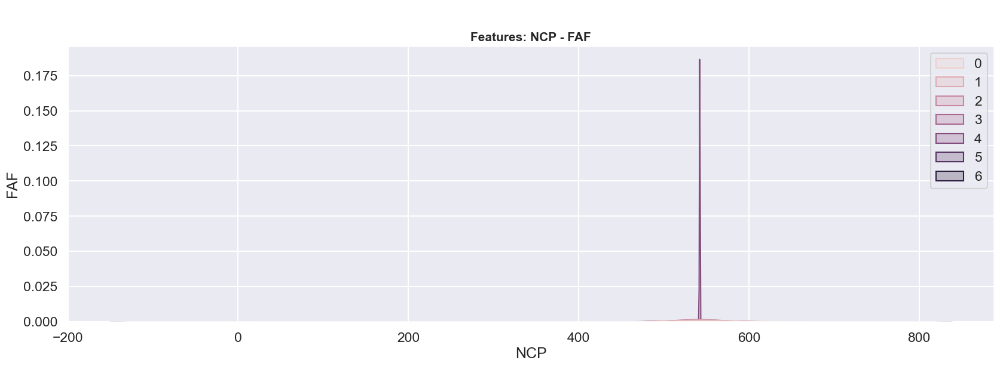

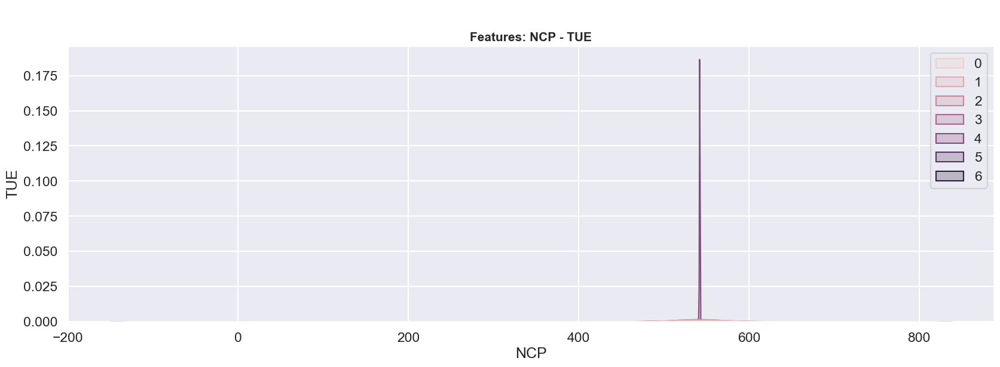

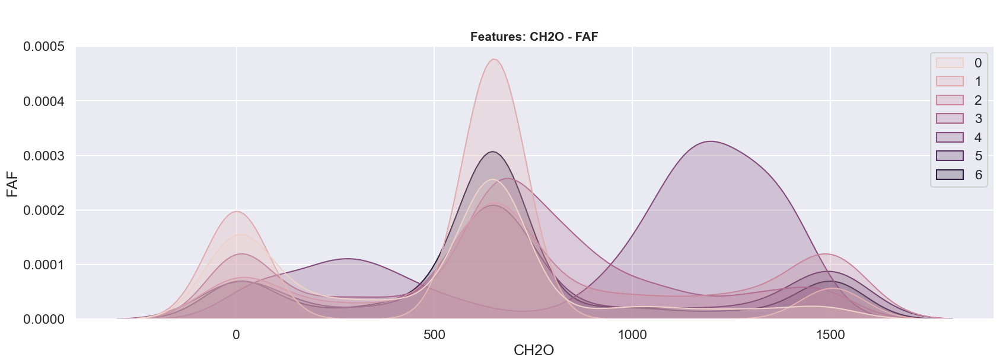

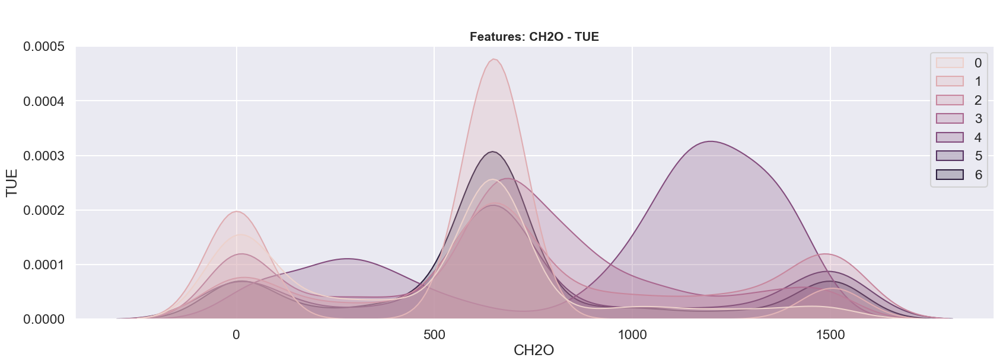

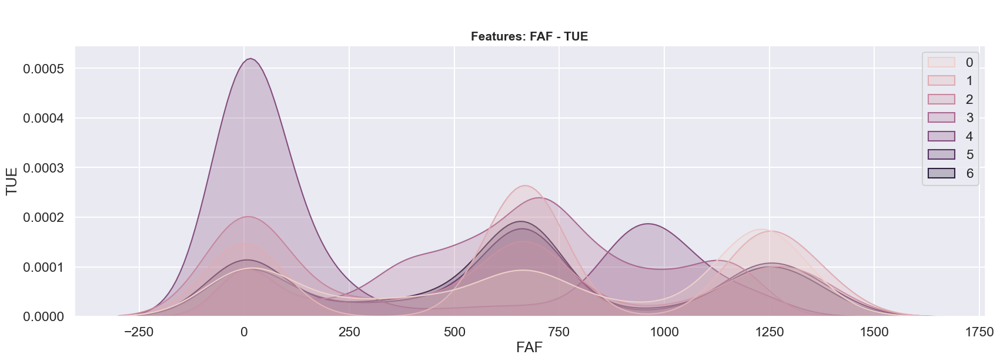

In [63]:
continuous_features = [
    'Age',
    'Height',
    'Weight',
    'NCP',
    'CH2O',
    'FAF',
    'TUE']

categorical_features = [
    'Gender', 
    'family_history_with_overweight', 
    'FAVC', 
    'CAEC',
    'SMOKE',
    'SCC',
    'CALC',
    'MTRANS',  
]
def draw_kdeplot():
    for index, value in enumerate(continuous_features[:-1]):
        for i in range(index + 1, len(continuous_features)):
            plt.figure(figsize=(20, 6))
            plt.xlabel(f'{value}')
            plt.ylabel(f'{continuous_features[i]}')
            plt.title(f'\n\nFeatures: {value} - {continuous_features[i]}', fontsize=15, fontweight='bold')
            sns.kdeplot(data=X, x=value, hue=y, fill=True)
            plt.show();
            
            
draw_kdeplot()

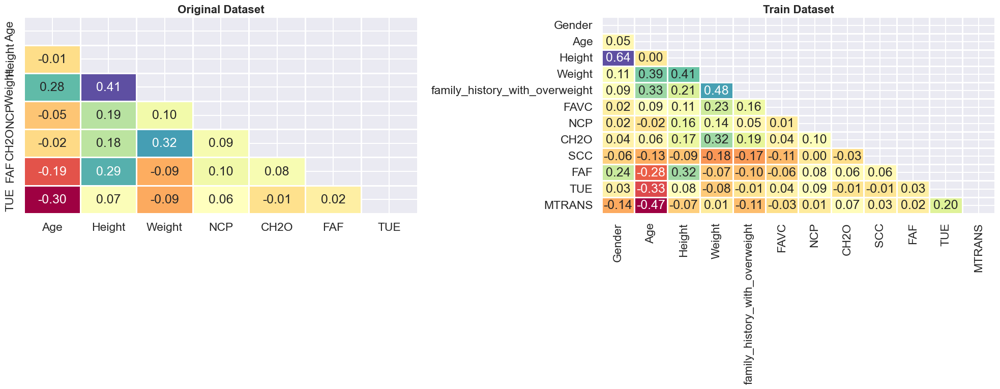

In [64]:
numeric_columns_original = train.select_dtypes(include=np.number)
numeric_columns_train = X.select_dtypes(include=np.number)

# Original dataset
corr_original = numeric_columns_original.corr(method='pearson')
mask_original = np.triu(np.ones_like(corr_original))
fig, axes = plt.subplots(1, 2, figsize=(20, 8))
sns.heatmap(corr_original, annot=True, fmt='.2f', mask=mask_original, cmap='Spectral', cbar=None, linewidth=2, ax=axes[0])
axes[0].set_title('Original Dataset', fontsize=16, fontweight='bold')

# Training dataset
corr_train = numeric_columns_train.corr(method='pearson')
mask_train = np.triu(np.ones_like(corr_train))
sns.heatmap(corr_train, annot=True, fmt='.2f', mask=mask_train, cmap='Spectral', cbar=None, linewidth=2, ax=axes[1])
axes[1].set_title('Train Dataset', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

In [19]:
scaler = MinMaxScaler()
x_encoded_normalized_train=scaler.fit_transform(X)
x_normalized_df = pd.DataFrame(x_encoded_normalized_train, columns=X.columns)


x_normalized_df.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FCVC,SCC,MTRANS
0,1.0,0.561692,0.448144,0.311931,1.0,0.249732,0.0,0.75
1,0.0,0.054054,0.062227,0.117796,1.0,0.249732,0.0,0.00
2,0.0,0.054054,0.498362,0.063701,1.0,0.193998,0.0,0.75
3,0.0,0.264982,0.495633,0.925683,1.0,1.000000,0.0,0.75
4,1.0,0.829612,0.992904,0.468150,1.0,0.700965,0.0,0.75


In [20]:
def get_model():
    model = keras.Sequential([
    layers.Input(shape=(x_encoded_normalized_train.shape[1],)),
    layers.Dense(256, activation='relu', kernel_regularizer=l2(0.001)), #256
    layers.Dense(128, activation='relu', kernel_regularizer=l2(0.001)), #0.001
    keras.layers.Dropout(.2),
    layers.Dense(32, activation='relu', kernel_regularizer=l2(0.001)),
    layers.Dense(7, activation='softmax')
])
    return model

In [21]:
LR = 0.0001 #0.0001
BATCH_SIZE = 25
VAL_SPLIT = 0.2
PATIENCE = 5
EPOCHS = 500
model = get_model()

In [22]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=PATIENCE,
    restore_best_weights=True
)

In [23]:
model.compile(optimizer=keras.optimizers.Adam(learning_rate=LR), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(x_encoded_normalized_train, y, 
                    epochs=EPOCHS,
                    batch_size=BATCH_SIZE, 
                    validation_split=VAL_SPLIT, 
                    callbacks=[early_stopping])

train_loss, train_accuracy = model.evaluate(x_encoded_normalized_train, y)

Epoch 1/500
600/600 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.3762 - loss: 1.9375 - val_accuracy: 0.6107 - val_loss: 1.2362
Epoch 2/500
600/600 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6144 - loss: 1.1782 - val_accuracy: 0.7271 - val_loss: 0.9231
Epoch 3/500
600/600 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6991 - loss: 0.9528 - val_accuracy: 0.7850 - val_loss: 0.8002
Epoch 4/500
600/600 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7381 - loss: 0.8432 - val_accuracy: 0.7916 - val_loss: 0.7363
Epoch 5/500
600/600 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7604 - loss: 0.7858 - val_accuracy: 0.8066 - val_loss: 0.6982
Epoch 6/500
600/600 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7737 - loss: 0.7457 - val_accuracy: 0.8154 - val_loss: 0.6748
Epoch 7/500
600/600 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7888 - loss: 0.7075 - val_accuracy: 0.8228 - val_loss: 0.6532
Epoch 8/500
600/600 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7935 - loss: 0.6935 - val_accu

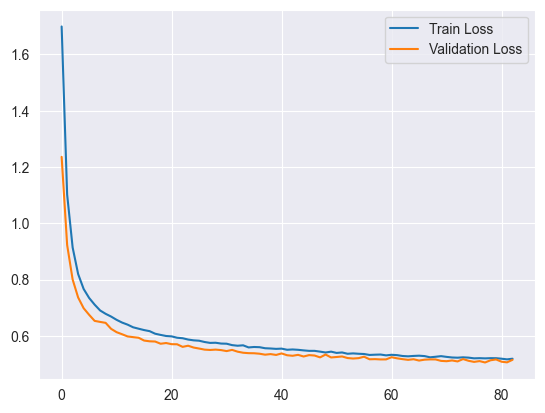

In [24]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

In [25]:
classes = {0: 'Insufficient_Weight',
 1: 'Normal_Weight',
 2: 'Overweight_Level_I',
 3: 'Overweight_Level_II',
 4: 'Obesity_Type_I',
 5: 'Obesity_Type_II',
 6: 'Obesity_Type_III'}

for features in columns_to_encode:
    test[features]=encoder.fit_transform(test[features])

x = np.array(test)

final_output = pd.read_csv('data/sample_submission.csv')

final_output.NObeyesdad = [classes[tf.argmax(i).numpy()] for i in model(x)]

final_output

,id,NObeyesdad
0,20758,Obesity_Type_I
1,20759,Obesity_Type_I
2,20760,Obesity_Type_I
3,20761,Obesity_Type_I
4,20762,Obesity_Type_I
...,...,...
13835,34593,Obesity_Type_I
13836,34594,Obesity_Type_I
13837,34595,Obesity_Type_III
13838,34596,Overweight_Level_II


In [26]:
set(final_output.NObeyesdad.values)

{'Insufficient_Weight',
 'Normal_Weight',
 'Obesity_Type_I',
 'Obesity_Type_II',
 'Obesity_Type_III',
 'Overweight_Level_I',
 'Overweight_Level_II'}

In [27]:
final_output.to_csv('submission.csv', index=False)

In [79]:
final_output.sum()

id                                                    383056600
NObeyesdad    Obesity_Type_IOverweight_Level_IObesity_Type_I...
dtype: object

In [29]:
import numpy as np
from scipy import optimize as opt

class NeuralNetwork:
    def __init__(self, input_layer_size, hidden_layer_size, output_layer_size, lambda_=1):
        self.input_layer_size = input_layer_size
        self.hidden_layer_size = hidden_layer_size
        self.output_layer_size = output_layer_size
        self.lambda_ = lambda_
        
        self.Theta1 = self.initialize_weights(input_layer_size, hidden_layer_size)
        self.Theta2 = self.initialize_weights(hidden_layer_size, output_layer_size)
        
        self.training_history = {'epochs': [], 'costs': [], 'accuracies': []}
    
    def initialize_weights(self, L_in, L_out):
        epsilon_init = 0.12
        return np.random.rand(L_out, 1 + L_in) * 2 * epsilon_init - epsilon_init
    
    def relu(self, z):
        return np.maximum(0, z)

    def relu_gradient(self, z):
        return (z > 0).astype(float)
    
    def softmax(self, z):
        exp_z = np.exp(z - np.max(z, axis=1, keepdims=True))
        return exp_z / np.sum(exp_z, axis=1, keepdims=True)

    def forward_propagation(self, X):
        a1 = np.insert(X, 0, 1, axis=1)
        z2 = np.matmul(a1, self.Theta1.T)
        a2 = self.relu(z2)
        a2 = np.insert(a2, 0, 1, axis=1)
        z3 = np.matmul(a2, self.Theta2.T)
        a3 = self.softmax(z3)
        return a1, z2, a2, z3, a3

    def backward_propagation(self, X, y, a1, z2, a2, z3, a3):
        m = X.shape[0]
        
        # Calculate deltas
        s3 = a3
        s3[np.arange(m), y - 1] -= 1  # Adjust for class index starting from 1
        s2 = np.matmul(s3, self.Theta2) * self.relu_gradient(np.insert(z2, 0, 1, axis=1))
        s2 = s2[:, 1:]
        
        # Gradients
        delta_1 = np.matmul(s2.T, a1)
        delta_2 = np.matmul(s3.T, a2)
        
        # Regularization
        p1 = (self.lambda_ / m) * np.insert(self.Theta1[:, 1:], 0, 0, axis=1)
        p2 = (self.lambda_ / m) * np.insert(self.Theta2[:, 1:], 0, 0, axis=1)
        
        Theta1_grad = delta_1 / m + p1
        Theta2_grad = delta_2 / m + p2
        
        return Theta1_grad, Theta2_grad

    def compute_cost(self, X, y):
        m = X.shape[0]
        _, _, _, _, a3 = self.forward_propagation(X)
        
        log_probs = -np.log(a3[np.arange(m), y - 1] + 1e-8)
        J = np.sum(log_probs) / m
        
        # Regularization
        J += self.lambda_ / (2 * m) * (
            np.sum(self.Theta1[:, 1:] ** 2) + np.sum(self.Theta2[:, 1:] ** 2)
        )
        
        return J

    def predict(self, X):
        _, _, _, _, a3 = self.forward_propagation(X)
        return np.argmax(a3, axis=1) + 1

    def calculate_accuracy(self, X, y):
        predictions = self.predict(X)
        accuracy = np.mean(predictions == y) * 100
        return accuracy

    def train(self, X, y, num_epochs=50, learning_rate=0.01, verbose=True):
        self.training_history = {'epochs': [], 'costs': [], 'accuracies': []}
        initial_nn_params = np.concatenate([self.Theta1.flatten(), self.Theta2.flatten()])
        
        def cost_func(nn_params):
            Theta1 = nn_params[:self.hidden_layer_size * (self.input_layer_size + 1)].reshape(
                (self.hidden_layer_size, self.input_layer_size + 1))
            Theta2 = nn_params[self.hidden_layer_size * (self.input_layer_size + 1):].reshape(
                (self.output_layer_size, self.hidden_layer_size + 1))
            self.Theta1, self.Theta2 = Theta1, Theta2
            return self.compute_cost(X, y)
        
        def gradient_func(nn_params):
            Theta1 = nn_params[:self.hidden_layer_size * (self.input_layer_size + 1)].reshape(
                (self.hidden_layer_size, self.input_layer_size + 1))
            Theta2 = nn_params[self.hidden_layer_size * (self.input_layer_size + 1):].reshape(
                (self.output_layer_size, self.hidden_layer_size + 1))
            self.Theta1, self.Theta2 = Theta1, Theta2
            a1, z2, a2, z3, a3 = self.forward_propagation(X)
            Theta1_grad, Theta2_grad = self.backward_propagation(X, y, a1, z2, a2, z3, a3)
            return np.concatenate([Theta1_grad.flatten(), Theta2_grad.flatten()])
        
        for epoch in range(num_epochs):
            result = opt.minimize(
                cost_func, 
                initial_nn_params, 
                method='CG', 
                jac=gradient_func,
                options={'maxiter': 1}
            )
            
            initial_nn_params = result.x
            self.Theta1 = initial_nn_params[:self.hidden_layer_size * (self.input_layer_size + 1)].reshape(
                (self.hidden_layer_size, self.input_layer_size + 1))
            self.Theta2 = initial_nn_params[self.hidden_layer_size * (self.input_layer_size + 1):].reshape(
                (self.output_layer_size, self.hidden_layer_size + 1))
            
            current_cost = self.compute_cost(X, y)
            current_accuracy = self.calculate_accuracy(X, y)
            self.training_history['epochs'].append(epoch + 1)
            self.training_history['costs'].append(current_cost)
            self.training_history['accuracies'].append(current_accuracy)
            
            if verbose:
                print(f"Epoch {epoch + 1}/{num_epochs}")
                print(f"Cost: {current_cost:.4f}, Accuracy: {current_accuracy:.2f}%\n")
        
        return self.training_history


Epoch 1/50
Cost: 12.7379, Accuracy: 8.44%

Epoch 2/50
Cost: 8.7673, Accuracy: 20.94%

Epoch 3/50
Cost: 7.8105, Accuracy: 15.80%

Epoch 4/50
Cost: 7.1772, Accuracy: 21.58%

Epoch 5/50
Cost: 6.1934, Accuracy: 16.95%

Epoch 6/50
Cost: 5.6067, Accuracy: 23.00%

Epoch 7/50
Cost: 5.0347, Accuracy: 17.72%

Epoch 8/50
Cost: 4.6222, Accuracy: 23.48%

Epoch 9/50
Cost: 4.1624, Accuracy: 20.55%
Epoch 10/50
Cost: 3.7929, Accuracy: 24.11%
Epoch 11/50
Cost: 3.4030, Accuracy: 28.91%

Epoch 12/50
Cost: 3.1244, Accuracy: 25.14%
Epoch 13/50
Cost: 2.8520, Accuracy: 32.97%
Epoch 14/50
Cost: 2.5422, Accuracy: 26.75%

Epoch 15/50
Cost: 2.3006, Accuracy: 35.97%
Epoch 16/50
Cost: 2.2016, Accuracy: 31.87%
Epoch 17/50
Cost: 2.1105, Accuracy: 36.13%

Epoch 18/50
Cost: 2.0375, Accuracy: 35.32%
Epoch 19/50
Cost: 1.9673, Accuracy: 35.97%
Epoch 20/50
Cost: 1.9126, Accuracy: 37.60%
Epoch 21/50
Cost: 1.8596, Accuracy: 35.90%

Epoch 22/50
Cost: 1.8193, Accuracy: 38.35%
Epoch 23/50
Cost: 1.7810, Accuracy: 35.82%
Epoch 24

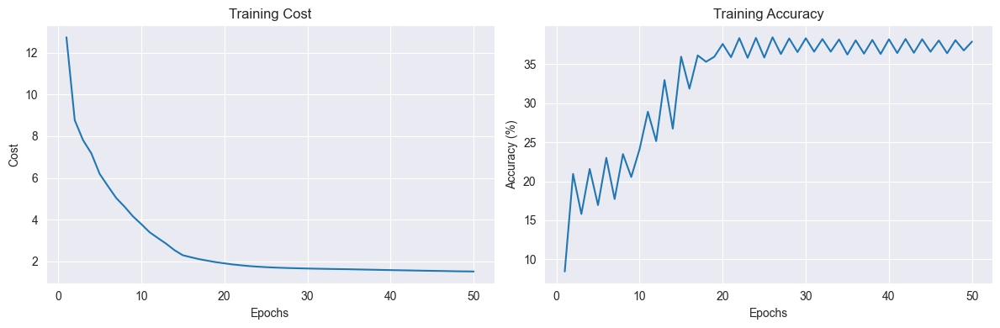

Predicted class for the new sample: 1


In [32]:
def main():
    
    
    

    # Create and train neural network
    nn = NeuralNetwork(
        input_layer_size=8,  # Number of features
        hidden_layer_size=6,  # Hidden units
        output_layer_size=7,  # Number of classes
        lambda_= 1           # Regularization parameter
    )
    
    # Train the network
    history = nn.train(X, y, num_epochs=50, learning_rate=0.00001, verbose=True)
    
    # Plot training progress
    import matplotlib.pyplot as plt
    
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(history['epochs'], history['costs'])
    plt.title('Training Cost')
    plt.xlabel('Epochs')
    plt.ylabel('Cost')
    
    plt.subplot(1, 2, 2)
    plt.plot(history['epochs'], history['accuracies'])
    plt.title('Training Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    
    plt.tight_layout()
    plt.show()
    
    # Test prediction on a new sample
    new_sample = np.random.rand(1, 8)  # Random normalized sample
    prediction = nn.predict(new_sample)
    print(f"Predicted class for the new sample: {prediction[0]}")

if __name__ == "__main__":
    main()
